#### Introduction
This Jupyter Notebook aims to explore and analyze geospatial data, specifically focusing on the Normalized Difference Vegetation Index (NDVI) derived from Sentinel-2 satellite imagery

By the end of this notebook, we will have a comprehensive understanding of how to analyze Sentinel-2 data for vegetation in an area if interest.

### ** Please put the "geospatial_test_datacube.nc" and "geospatial_sub_aoi.geojson" file in the same repository as this notebook **

In [1]:

# ##install packages (if required)
%pip install numpy --quiet
%pip install rasterio --quiet
%pip install geopandas --quiet
%pip install matplotlib --quiet
%pip install xarray --quiet

DEPRECATION: flatbuffers 1.12.1-git20200711.33e2d80-dfsg1-0.6 has a non-standard version number. pip 24.1 will enforce this behaviour change. A possible replacement is to upgrade to a newer version of flatbuffers or contact the author to suggest that they release a version with a conforming version number. Discussion can be found at https://github.com/pypa/pip/issues/12063
Note: you may need to restart the kernel to use updated packages.
DEPRECATION: flatbuffers 1.12.1-git20200711.33e2d80-dfsg1-0.6 has a non-standard version number. pip 24.1 will enforce this behaviour change. A possible replacement is to upgrade to a newer version of flatbuffers or contact the author to suggest that they release a version with a conforming version number. Discussion can be found at https://github.com/pypa/pip/issues/12063
Note: you may need to restart the kernel to use updated packages.
DEPRECATION: flatbuffers 1.12.1-git20200711.33e2d80-dfsg1-0.6 has a non-standard version number. pip 24.1 will enfor

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import xarray as xr
import json
import geopandas as gpd
from rasterio.features import geometry_mask

import warnings
warnings.filterwarnings('ignore')


Load the Sentinel-2 data cube:

In [3]:
# Load the netCDF file
data_cube = xr.open_dataset('geospatial_test_datacube.nc')

# Inspect the data cube
data_cube

<xarray.Dataset> Size: 25MB
Dimensions:   (time: 23, y: 227, x: 304)
Coordinates:
  * time      (time) datetime64[ns] 184B 2021-04-09 2021-04-14 ... 2021-11-25
  * y         (y) float32 908B 45.23 45.23 45.23 45.23 ... 45.21 45.21 45.21
  * x         (x) float32 1kB -69.95 -69.95 -69.95 ... -69.92 -69.92 -69.92
Data variables:
    S2_RED    (time, y, x) float32 6MB ...
    S2_GREEN  (time, y, x) float32 6MB ...
    S2_BLUE   (time, y, x) float32 6MB ...
    S2_NIR    (time, y, x) float32 6MB ...
Attributes:
    transform:        [ 8.98405270e-05  0.00000000e+00 -6.99499045e+01  0.000...
    crs:              +init=epsg:4326
    res:              [8.98405270e-05 9.04387077e-05]
    descriptions:     ['RED', 'GREEN', 'BLUE', 'NIR']
    AREA_OR_POINT:    Area
    _FillValue:       nan
    s2_data_lineage:  {"Data origin": "S3 bucket (ARN=arn:aws:s3:::sentinel-c...
    ulx, uly:         [-69.94990454  45.23320715]

## 1. Visualisation of the available data variables: red, green blue and Near InfraRed(NIR).

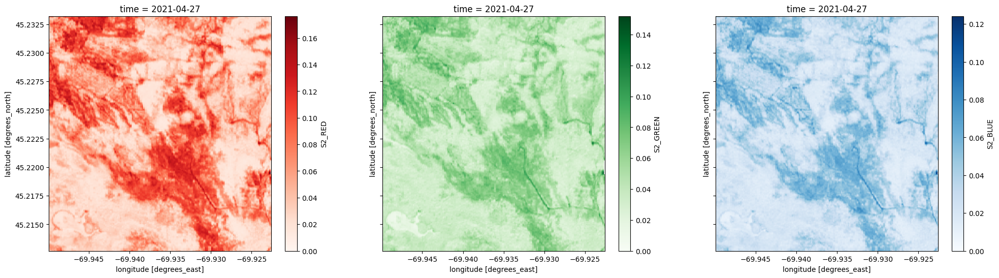

In [4]:
TIME2PLOT = 2
# Plot the data cube

red_band = data_cube.S2_RED
green_band = data_cube.S2_GREEN
blue_band = data_cube.S2_BLUE

fig, [ax1, ax2, ax3] = plt.subplots(1, 3, sharey=True, figsize=(24, 6))
plt.subplot(1, 3, 1)
red_band.isel(time=TIME2PLOT).plot(cmap='Reds')

plt.subplot(1, 3, 2)
green_band.isel(time=TIME2PLOT).plot(cmap='Greens')

plt.subplot(1, 3, 3)
blue_band.isel(time=TIME2PLOT).plot(cmap='Blues')

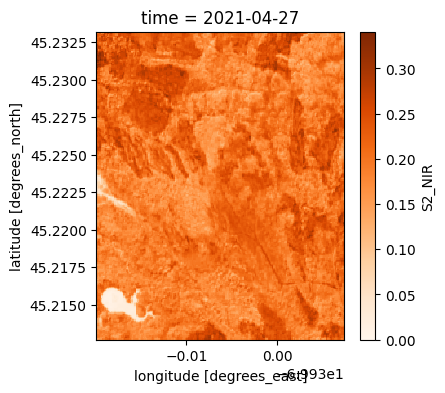

In [5]:
#plot the NIR band
nir_band = data_cube.S2_NIR
plt.figure(figsize=(4,4))
nir_band.isel(time=TIME2PLOT).plot(cmap='Oranges')



These images are intensity maps, where each pixel represents the amount of reflected light that the Sentinel-2's sensor captured in the red/blue/green/NIR band.

To make an RGB composite we have to stack together the Red, Green and Blue band images into one image.

## 2. Visual RGB image

#### RGB image with brute data

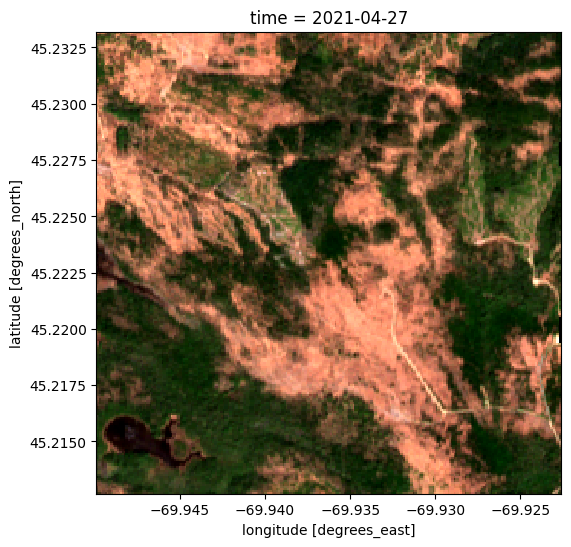

In [6]:
bands = ['S2_RED', 'S2_GREEN', 'S2_BLUE']
data_cube[bands].isel(**{'time': TIME2PLOT}).to_array().plot.imshow(robust=True, figsize=(6, 6))

#### We can make it prettier as we can nornalize the color and add some brightness

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

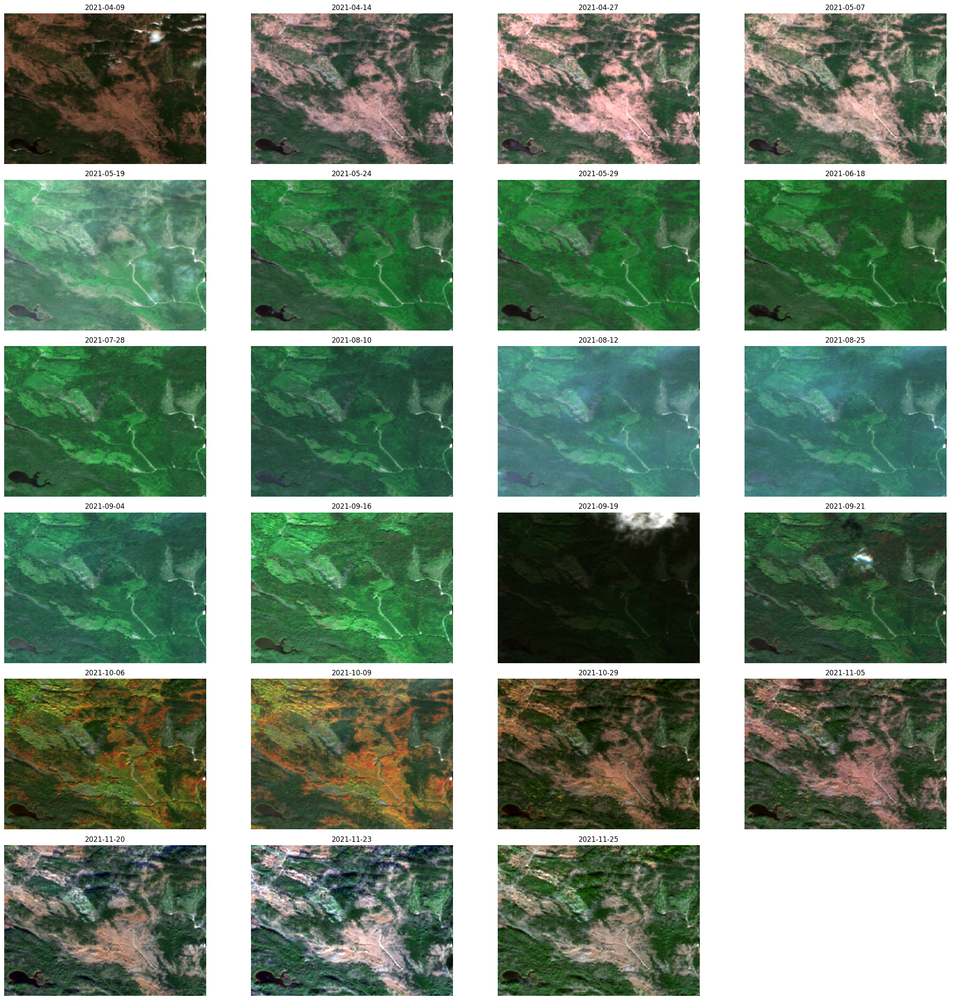

In [7]:
def get_rgb(data_cube, brightness=1):
    def normalize_band(band):
        band_min = band.min()
        return (band - band_min) / (band.max() - band_min)
    
    red_band = data_cube.S2_RED
    green_band = data_cube.S2_GREEN
    blue_band = data_cube.S2_BLUE

    red = normalize_band(red_band) * brightness
    green = normalize_band(green_band) * brightness
    blue = normalize_band(blue_band) * brightness

    return np.dstack((red, green, blue))

def plot_rgb(data_cube, time_index, brightness=1):
    rgb_image = get_rgb(data_cube.isel(time=time_index), brightness)
    plt.figure(figsize=(6,6)),
    plt.imshow(rgb_image)
    plt.show()
def plot_all_dates(data_cube):
    # Plot all dates in a subplot grid
    num_dates = len(data_cube.time)
    num_cols = 4
    num_rows = int(np.ceil(num_dates / num_cols))
    fig, axs = plt.subplots(num_rows, num_cols, figsize=(6*num_cols, 4*num_rows))
    for i, ax in enumerate(axs.flat):
        if i < num_dates:
            rgb_image = get_rgb(data_cube.isel(time=i), brightness=1.5)
            ax.imshow(rgb_image)
            # ax.imshow((rgb_image * 255).astype(np.uint8))   #USE THIS TO TURN OFF WARNING, BUT MAKE THE CLOUD HAVE BIZARE COLOR
            ax.set_title(str(data_cube.time[i].values)[:10])
        ax.axis('off')
    plt.tight_layout()
    plt.show()
    
# plot_rgb(data_cube, TIME2PLOT, brightness=1.5)
plot_all_dates(data_cube)


## 3. Normalized Difference Vegetation Index (NDVI)

NDVI is calculated as the difference between NIR (strongly reflected by vegetation) and red light (absorbed by vegetation).

$NDVI \in \left(-1, +1\right)$

$NDVI = \frac{NIR - Red}{NIR + Red}$

For negative values, it's probably water. Whereas, for values close to +1, it’s probably dense green leaves. While, values close to zero might indicate  an urbanized area which doesn't have much green leaves.

While it’s possible to identify vegetation in the RGB image, it can be helpful to have a quantitative index to describe the health of vegetation directly.

In [8]:
import xarray as xr
band_diff = data_cube.S2_NIR - data_cube.S2_RED
band_sum = data_cube.S2_NIR + data_cube.S2_RED

ndvi = band_diff / band_sum

### Add NDVI Layers Back to the Original Data Cube

In [9]:
# Create a new DataArray for NDVI
ndvi_da = xr.DataArray(ndvi, coords=data_cube.coords, dims=data_cube.dims)
ndvi_da.name = 'NDVI'

# Merge the NDVI DataArray with the original data cube
data_cube = xr.merge([data_cube, ndvi_da])

# Save the data cube with NDVI to a new netCDF file
# data_cube.to_netcdf('geospatial_test_datacube_with_ndvi.nc')

# data_cube

Plotting all of the time steps at once make it easier to notice differences in vegetation over time.

- The NDVI values are represented by a color gradient from red (low NDVI values) to green (high NDVI values).
   - Red and orange areas indicate sparse or no vegetation.
   - Green areas indicate healthy, dense vegetation.

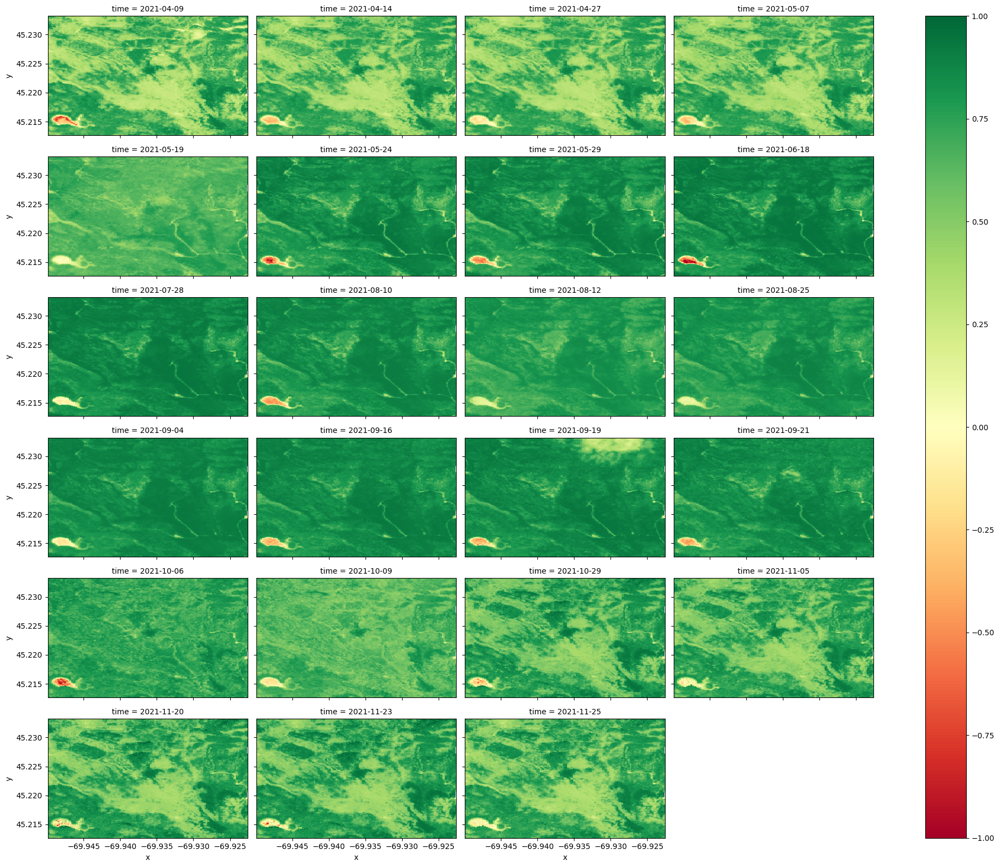

In [10]:
ndvi.plot(col='time', cmap="RdYlGn", vmin=-1, vmax=1, col_wrap=4, figsize=(20, 16))
plt.show()

I chose to change the colorbar limit to 0 to 1, to hightlight the dense vegetation zone

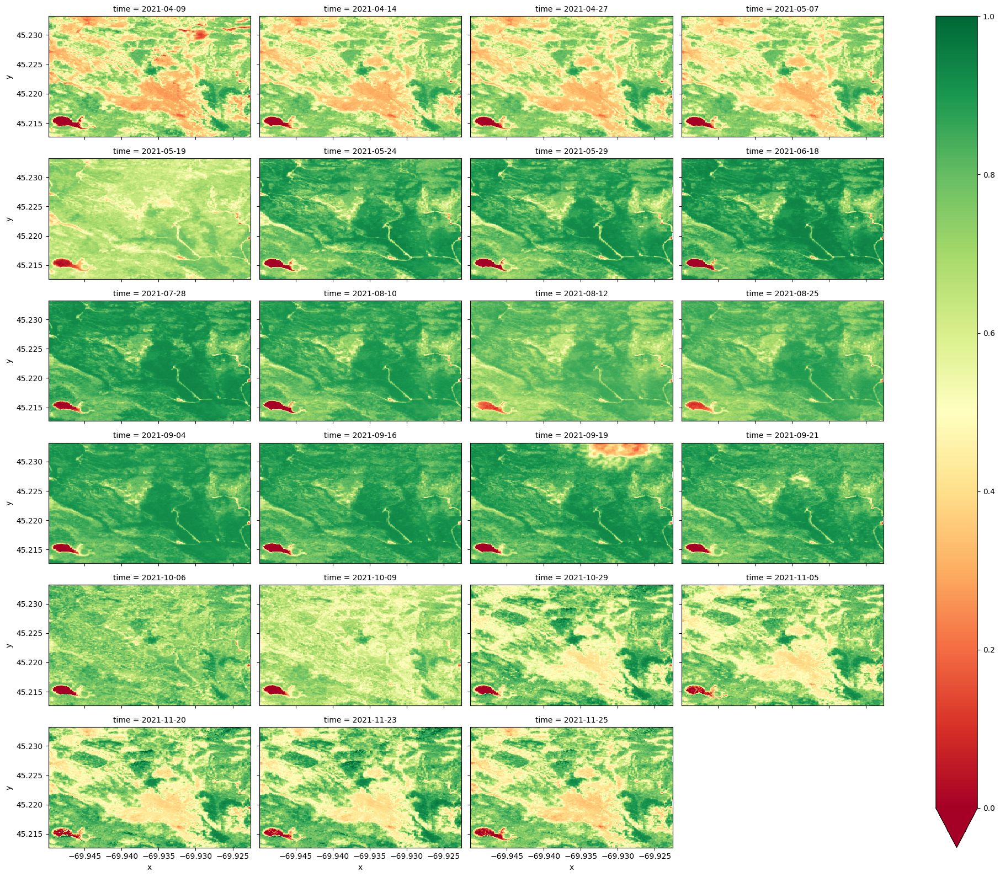

In [11]:
ndvi.plot(col='time', cmap="RdYlGn", vmin=0, vmax=1, col_wrap=4, figsize=(20, 16))
plt.show()

### Distribution (histogram) of NDVI pixels

A Histogram or any other chart can be useful for quick analysis by giving a visual insight into the distribution of "healthy" vs "unhealthy" vegetation values in your study area.

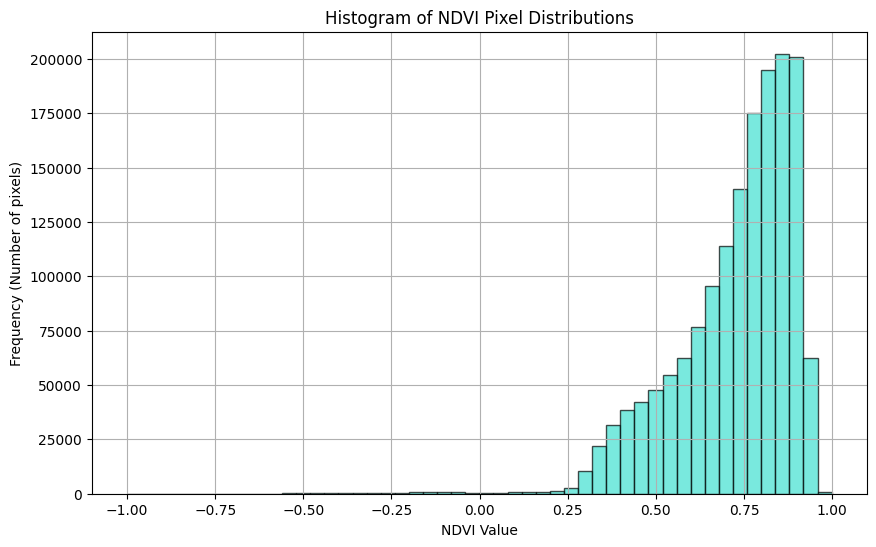

In [12]:
ndvi_flatten =  ndvi.values.flatten()
plt.figure(figsize=(10, 6))
plt.hist(ndvi_flatten, bins=50, color='turquoise', edgecolor='black', alpha=0.7)
plt.title('Histogram of NDVI Pixel Distributions')
plt.xlabel('NDVI Value')
plt.ylabel('Frequency (Number of pixels)')
plt.grid(True)
plt.show()

1. Distribution Shape:
        The distribution is highly skewed to the right, with the majority of the pixel values falling between 0.5 and 1.0.
        There are very few pixels with NDVI values less than 0.
2. Frequency of NDVI Values:
        The frequency of pixels increases as the NDVI value increases, peaking around 0.75 to 1.
        The highest frequency is observed at NDVI values close to 1.0, indicating a large number of pixels with high NDVI values.

### Time Series of NDVI Averaged Over the AOI:

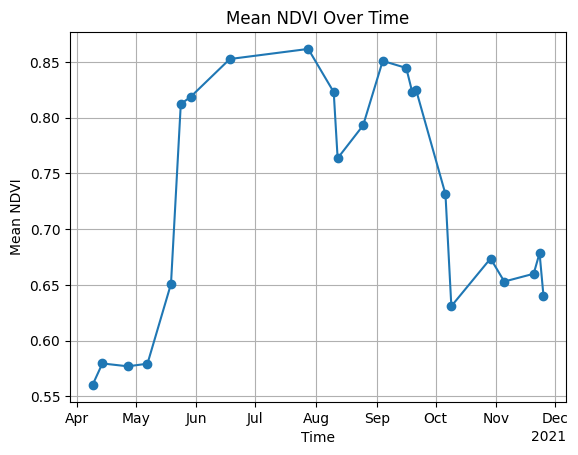

In [13]:
mean_ndvi = ndvi.mean(dim=['x', 'y'])
mean_ndvi.plot.line(marker='o')
plt.title('Mean NDVI Over Time')
plt.xlabel('Time')
plt.ylabel('Mean NDVI')
plt.grid(True)
plt.show()

## 4. Interpretation of Spatial Distribution and Evolution of NDVI/Vegetation


## Spatial Distribution and Time Series
1. **April - Early May:**
   - In early April, there are significant areas of orange and light green and the mean NDVI values over the AOI are relatively low, indicating sparse to moderate vegetation cover.
   - Vegetation is beginning to emerge and grow, but it hasn't reached peak density yet.

2. **May - August:**
   - From mid-May to August, the majority of the area turns green, indicating an increase in vegetation density.
   - The overall NDVI values increase reapidly during May-Early July, signifying healthy vegetation growth during the peak growing season.
   
   - During July - August, The NDVI values remain high, with widespread dark green areas indicating sustained healthy vegetation with is mature and fully developed.

3. **September - November:**
   - In September, the vegetation density starts to decrease gradually, as indicated by the appearance of more light green areas.
   - By October and early November, there is a noticeable increase in light green and some orange areas and deacrese of mean NDVI value in timeserie, indicating a reduction in vegetation density and health, likely due to seasonal changes.

   
Initially, vegetation cover is sparse, but it rapidly increases and reaches peak density in the summer months. As the season progresses into autumn, the vegetation begins to decline, reflecting the natural senescence process. 

## Histogram 


### Interpretation:

1. Vegetation Health: The histogram showing a high frequency of NDVI values close to 1.0 indicates that the majority of the area is covered with healthy vegetation. This suggests a predominance of vegetative surfaces, which could be characteristic of regions such as forests, agricultural lands

2. Minimal presence of non-vegetative features like water bodies, barren land, or urban areas is observed. This supports the conclusion that the region is largely vegetated.


# Conclusion:

The histogram indicates that the majority of the area analyzed is covered with healthy vegetation, with some minimal presence of non-vegetative surfaces such as water bodies, barren land, or urban areas. 

The spatial distribution and temporal evolution of NDVI in this dataset reveal a typical growing season pattern for vegetation. This cycle is indicative of a temperate climate region with distinct growing seasons.



Overall, the analysis highlights the importance of monitoring NDVI values for assessing vegetation health and tracking seasonal changes in vegetation cover, which are critical indicators of ecosystem vitality and resilience.

# Visualization of NDVI Clipped to the Provided Sub-AOI

In [14]:

aoi = gpd.read_file('geospatial_sub_aoi.geojson')
# aoi.plot()


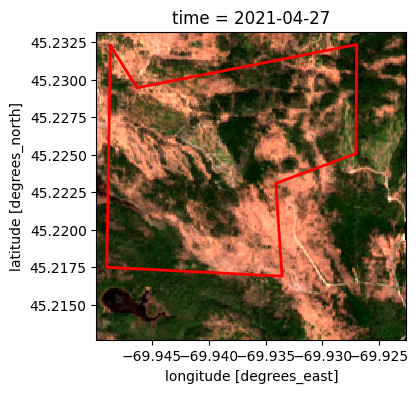

In [15]:
# Plot the RGB image

rgb_data = xr.concat([data_cube.S2_RED, data_cube.S2_GREEN, data_cube.S2_BLUE], dim='rgb')
rgb_data.isel(time=TIME2PLOT).plot.imshow(robust=True, figsize=(4, 4))

# Plot the AOI on top of the RGB image
for feature in aoi['geometry']:
    if feature.geom_type == 'Polygon':
        x, y = feature.exterior.xy
        plt.plot(x, y, marker=None, color='r', linewidth=2)


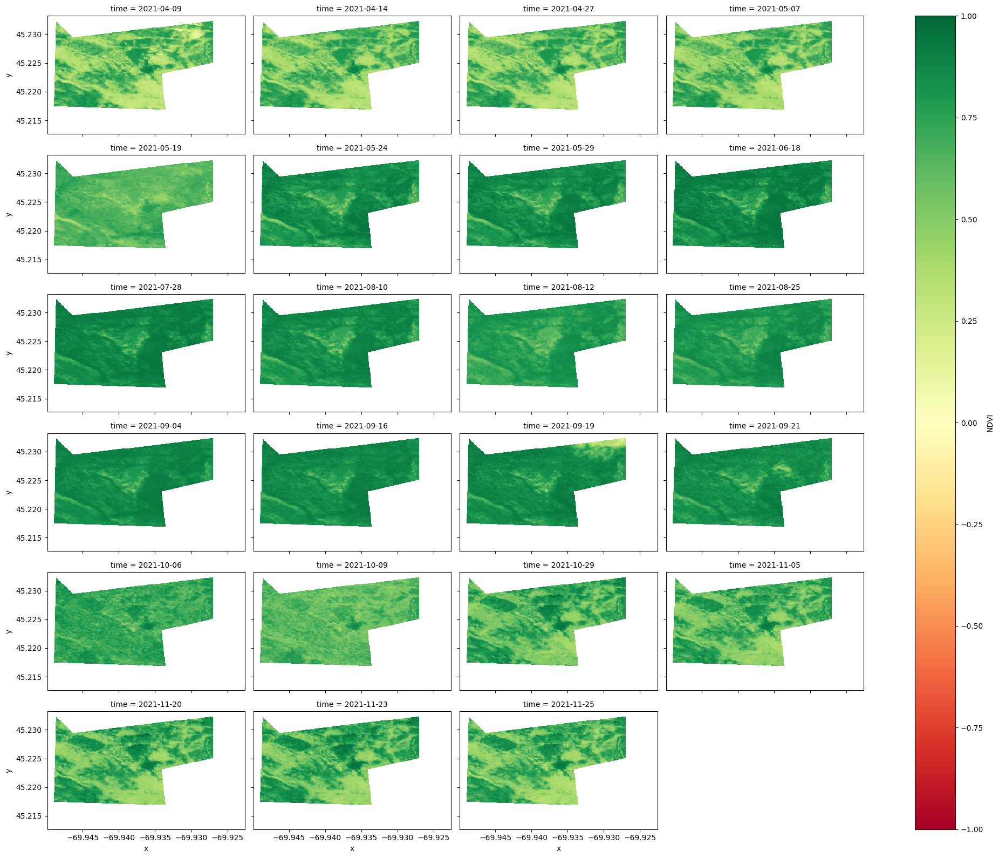

In [16]:
aoi = aoi.to_crs(data_cube.crs)
aoi_geometry = [feature['geometry'] for feature in json.loads(aoi.to_json())['features']]

mask = geometry_mask(aoi_geometry, transform=data_cube.attrs['transform'], invert=True,
                     out_shape=(data_cube.dims['y'], data_cube.dims['x']))

masked_ndvi = data_cube.NDVI.where(mask)  

masked_ndvi.plot(col='time', col_wrap=4, cmap='RdYlGn', vmin=-1, vmax=1, figsize=(20, 16))
plt.title('NDVI Time Series for sub-AOI')
plt.show()

#save the masked ndvi to a new netCDF file
# masked_ndvi.to_netcdf('geospatial_test_datacube_masked_ndvi.nc')

By: Tham LE, thamle.work@gmail.com